## **Thematic Map of South America**
-----
#### SDS 210 - Programming with Spatial Data

*Author: Isabelle Bartholet*

*Date: 22. May 2026*

### **Research Question**
* Is there a relationship between fire brightness [°C] and fire radiative power (FRP)  in Trinidad and Tobago?


### **Content**

1. Load important packages 
2. Call map key via function check_map_key()
3. Fetch the data via function fetch_data()
4. Convert Data to gdf
5. Data handling (Rescaling and Filtering)
6. Create thematic map with brightness (°C) as icon colour and FRP(W/m^2) as icon diameter



### **Sources**

For detailed information see ReadMe.pdf




------
#### **Important Libraries and Map Key** 

In [2]:
import requests
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
import statistics
import numpy as np

from config import MAP_KEY
from access_mapkey import check_map_key
from FetchFireData2 import fetch_data




#### **Access Map Key**

In [3]:
check_map_key(MAP_KEY) #calls function to verify API key status and remaining transactions

transaction_limit             5000
current_transactions             0
transaction_interval    10 minutes
dtype: object


{'transaction_limit': 5000,
 'current_transactions': 0,
 'transaction_interval': '10 minutes'}

#### **Import Data for the Last Five Days**

In [4]:

df_fire = fetch_data(MAP_KEY)

# check length of df_fire, to see whether it worked correctly
print(f"There are {len(df_fire)} rows in this data frame.")

# quickly check dataframe by using head
df_fire.head(6)


Request successful


 Data download successful! 8091 fires found.
There are 8091 rows in this data frame.


,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,daynight
0,-4.36924,-37.89744,316.02,0.38,0.43,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.88,1.77,N
1,-3.59496,-38.85813,333.97,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.87,5.98,N
2,-3.59429,-38.86220,328.44,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.02,5.69,N
3,-14.48688,-46.51822,338.81,0.48,0.64,2026-05-18,340,N20,VIIRS,n,2.0NRT,290.84,3.66,N
4,-14.48594,-46.52267,310.14,0.48,0.64,2026-05-18,340,N20,VIIRS,n,2.0NRT,290.06,3.66,N
5,-14.05726,-44.47939,299.95,0.36,0.57,2026-05-18,340,N20,VIIRS,n,2.0NRT,289.47,0.53,N


#### **Convert Fire Dataframe into GDF and Check for NAs**

In [5]:
# create gdf 
gdf_fire = gpd.GeoDataFrame(
    df_fire, 
    geometry=gpd.points_from_xy(
        df_fire.longitude, df_fire.latitude),
        
        crs="EPSG:4326")

# check, to see if gdf returns the same information as the df above 
gdf_fire.head(6)


# check for NAs
gdf_fire.info()
print(f"There are no NAs in this gdf.") ## noch ändern zu etwas, was mit gdf_fire.info() zusammenhängt


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8091 entries, 0 to 8090
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   latitude    8091 non-null   float64 
 1   longitude   8091 non-null   float64 
 2   bright_ti4  8091 non-null   float64 
 3   scan        8091 non-null   float64 
 4   track       8091 non-null   float64 
 5   acq_date    8091 non-null   str     
 6   acq_time    8091 non-null   int64   
 7   satellite   8091 non-null   str     
 8   instrument  8091 non-null   str     
 9   confidence  8091 non-null   str     
 10  version     8091 non-null   str     
 11  bright_ti5  8091 non-null   float64 
 12  frp         8091 non-null   float64 
 13  daynight    8091 non-null   str     
 14  geometry    8091 non-null   geometry
dtypes: float64(7), geometry(1), int64(1), str(6)
memory usage: 1.1 MB
There are no NAs in this gdf.


#### **Filter and Relabelling Confidence Values**

The confidence attribute identifies the quality of every hotspot/fire pixel. It accounts for sun glint contamination during the day. Areas with low confidence (l) are associated with areas of sun glint. Nominal confidence pixels (n) are free of potential sun glint contamination. Pixels showing high confidence (h) are indicative for saturated day or nighttime pixels.  
(NASA: VIIRS I-Band 375m Active Fire Data, URL: https://www.earthdata.nasa.gov/data/instruments/viirs/viirs-i-band-375-m-active-fire-data, last access: 22.05.2026)


l: low -> filtered out, because it is very likely to only be sunglint

n: nominal -> Name tag "Medium"

h: high -> Name tag "High"

In [6]:
gdf_fire_reduced = gdf_fire[(gdf_fire["confidence"]!="l")].copy()
gdf_fire_reduced.head(10)

# check if no low confidence fires are included

gdf_fire_reduced["confidence"].unique()

#other method
#gdf_fire_reduced[gdf_fire_reduced["confidence"] == "l"]

<ArrowStringArray>
['n', 'h']
Length: 2, dtype: str

In [7]:
## creating another column for having a proper label in the map

gdf_fire_reduced["confidence_label"] = np.where(
    gdf_fire_reduced["confidence"] == "n", "Medium", "High"
) #np.where ...

gdf_fire_reduced.head(4) #quick check

,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,daynight,geometry,confidence_label
0,-4.36924,-37.89744,316.02,0.38,0.43,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.88,1.77,N,POINT (-37.89744 -4.36924),Medium
1,-3.59496,-38.85813,333.97,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.87,5.98,N,POINT (-38.85813 -3.59496),Medium
2,-3.59429,-38.86220,328.44,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.02,5.69,N,POINT (-38.8622 -3.59429),Medium
3,-14.48688,-46.51822,338.81,0.48,0.64,2026-05-18,340,N20,VIIRS,n,2.0NRT,290.84,3.66,N,POINT (-46.51822 -14.48688),Medium


#### **Conversion of Brightness Values from Kelvin to Degrees Celsius °C**

0 Kelvin = -273.15 °C

Conversion: °C = °K - 273.15

apply this on column bright_ti4

In [8]:
gdf_fire_reduced["bright_ti4_celsius"] = gdf_fire_reduced["bright_ti4"] - 273.15

gdf_fire_reduced.head(7) #check whether conversion worked

,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,daynight,geometry,confidence_label,bright_ti4_celsius
0,-4.36924,-37.89744,316.02,0.38,0.43,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.88,1.77,N,POINT (-37.89744 -4.36924),Medium,42.87
1,-3.59496,-38.85813,333.97,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.87,5.98,N,POINT (-38.85813 -3.59496),Medium,60.82
2,-3.59429,-38.86220,328.44,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.02,5.69,N,POINT (-38.8622 -3.59429),Medium,55.29
3,-14.48688,-46.51822,338.81,0.48,0.64,2026-05-18,340,N20,VIIRS,n,2.0NRT,290.84,3.66,N,POINT (-46.51822 -14.48688),Medium,65.66
4,-14.48594,-46.52267,310.14,0.48,0.64,2026-05-18,340,N20,VIIRS,n,2.0NRT,290.06,3.66,N,POINT (-46.52267 -14.48594),Medium,36.99
5,-14.05726,-44.47939,299.95,0.36,0.57,2026-05-18,340,N20,VIIRS,n,2.0NRT,289.47,0.53,N,POINT (-44.47939 -14.05726),Medium,26.80
6,-14.05661,-44.48267,299.23,0.36,0.57,2026-05-18,340,N20,VIIRS,n,2.0NRT,288.25,0.50,N,POINT (-44.48267 -14.05661),Medium,26.08


#### **Analyse Fire Brightness Data**

In the map, the brightness value will be used to colour the icons. Therefore, a quick analysis is made to see how the values are distributed and which classification method is most appropriate. 

Text(0, 0.5, 'Number of Fires Detected')

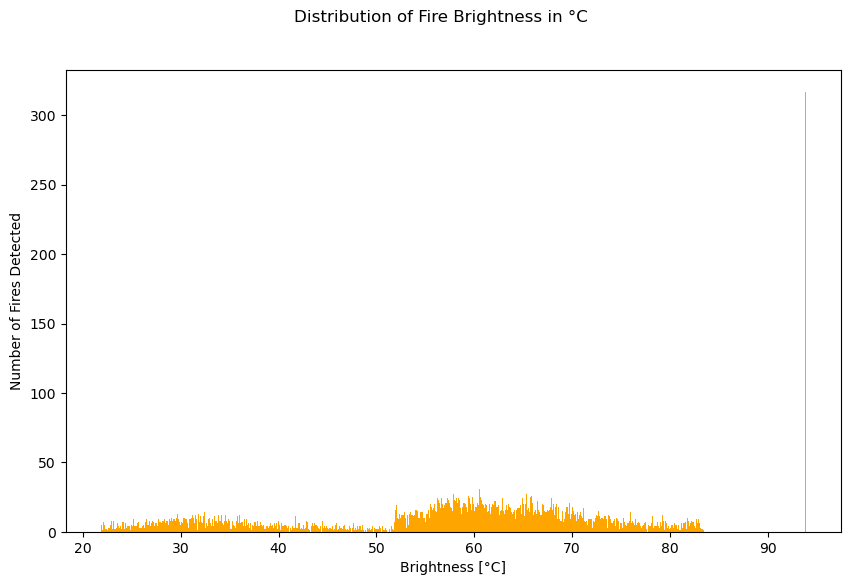

In [9]:
## make histogram of "bright_ti4_celsius" column

fig, ax = plt.subplots(figsize=(10,6))

ax.hist(
    gdf_fire_reduced["bright_ti4_celsius"].dropna(),
    bins=1000,
    color = "orange"
)

fig.suptitle("Distribution of Fire Brightness in °C", fontsize =12)
ax.set_xlabel("Brightness [°C]")
ax.set_ylabel("Number of Fires Detected")

In [10]:
# filter for max and min value of brightness, add float to only get the number
max_value = float(gdf_fire_reduced["bright_ti4_celsius"].max())
min_value = float(gdf_fire_reduced["bright_ti4_celsius"].min())

print(f"The maximum value of brightness is {max_value:.2f} °C and the minimum value of brightness is {min_value:.2f} °C.")
print(f"The distribution is rather even. However, the highest number of fires show a rather high temperature with {max_value:.2f} °C")
print(f"By looking at the rest of the data, it is assumed that the values around {max_value:.2f} are outliers. Thus, they will be removed from the dataset.")

The maximum value of brightness is 93.85 °C and the minimum value of brightness is 21.88 °C.
The distribution is rather even. However, the highest number of fires show a rather high temperature with 93.85 °C
By looking at the rest of the data, it is assumed that the values around 93.85 are outliers. Thus, they will be removed from the dataset.


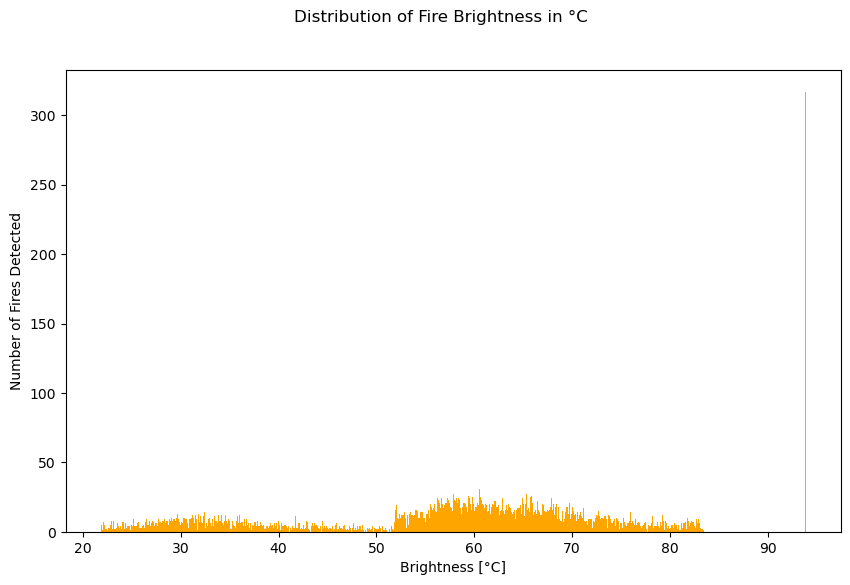

In [12]:
## remove outliers from dataset
gdf_fire_reduced= gdf_fire_reduced[gdf_fire_reduced["bright_ti4_celsius"] < 93]

# check, whether it has worked
max_value_new = float(gdf_fire_reduced["bright_ti4_celsius"].max())
print(f"The new maximum value of brightness is {max_value_new:.2f} °C.")

The new maximum value of brightness is 83.38 °C.


In [14]:
# get mean and median values for brightness
mean_value = float(gdf_fire_reduced["bright_ti4_celsius"].mean())
median_value = float(gdf_fire_reduced["bright_ti4_celsius"].median())

print(f"The mean value of brightness is {mean_value:.2f} °C and the median value of brightness is {median_value:.2f} °C.")

The mean value of brightness is 56.12 °C and the median value of brightness is 59.27 °C.


In [16]:
print(f"Now the brightness values are more evenly distributed in the range of {min_value:.2f}°C to {max_value_new:.2f}°C. \n Thus, a quartile calssification for the visualisation seems appropriate. By dividing the data into four equal groups (25% each), all classes should roughly have the same number of fire detections.")

Now the brightness values are more evenly distributed in the range of 21.88°C to 83.38°C. 
 Thus, a quartile calssification for the visualisation seems appropriate. By dividing the data into four equal groups (25% each), all classes should roughly have the same number of fire detections.


#### **Create Thematic Map**

First, the Fire Radiative Power (FRP) attribute will be adjusted, so it can be used for the icon size. This is done, to construct circles with radii proportional to the magnitude of FRP.

In [13]:
## As the circle diameter of the fire points will be scaled using the frp values, some more information on these values is needed, too, to create a well-fitted legend.

icon_size = 25 + (np.sqrt(gdf_fire_reduced["frp"])*3)

#calculate different values (min, max, mean, median) in px

icon_size_min = 25+(np.sqrt(gdf_fire_reduced["frp"].min())*3)
icon_size_max = 25+(np.sqrt(gdf_fire_reduced["frp"].max())*3)
icon_size_mean = 25+(np.sqrt(gdf_fire_reduced["frp"].mean())*3)
icon_size_median = 25+(np.sqrt(gdf_fire_reduced["frp"].median())*3)

print(f"The minimum size of the icon is {icon_size_min:.2f}px.")
print(f"The maximum size of the icon is {icon_size_max:.2f}px.")
print(f"The mean size of the icon is {icon_size_mean:.2f}px.")
print(f"The median size of the icon is {icon_size_median:.2f}px.")


## make this calculations because legend looks weird

# sort it first 
gdf_fire_reduced_sorted = gdf_fire_reduced.sort_values("frp", ascending=False).copy()

# calculate icon_size 
gdf_fire_reduced_sorted["icon_size"] = 25 + (np.sqrt(gdf_fire_reduced_sorted["frp"]) * 3)

gdf_fire_reduced_sorted.head()

The minimum size of the icon is 25.85px.
The maximum size of the icon is 66.97px.
The mean size of the icon is 32.84px.
The median size of the icon is 31.09px.


,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,daynight,geometry,confidence_label,bright_ti4_celsius,icon_size
1335,9.64712,-63.62627,354.59,0.47,0.48,2026-05-18,1802,N20,VIIRS,n,2.0NRT,301.82,195.68,D,POINT (-63.62627 9.64712),Medium,81.44,66.965700
4173,-10.65461,-42.29806,352.52,0.56,0.69,2026-05-20,1537,N20,VIIRS,n,2.0NRT,308.78,151.61,D,POINT (-42.29806 -10.65461),Medium,79.37,61.939004
563,-10.36914,-46.96524,343.49,0.52,0.50,2026-05-18,1613,N20,VIIRS,n,2.0NRT,307.80,143.33,D,POINT (-46.96524 -10.36914),Medium,70.34,60.916152
3508,-35.29312,-72.31784,351.07,0.44,0.46,2026-05-19,1910,N20,VIIRS,n,2.0NRT,303.92,127.48,D,POINT (-72.31784 -35.29312),Medium,77.92,58.872112
6492,-26.75184,-52.08377,334.43,0.54,0.42,2026-05-21,1654,N20,VIIRS,n,2.0NRT,296.83,117.44,D,POINT (-52.08377 -26.75184),Medium,61.28,57.510921


In [15]:
## creating another column for labelling the confidence in the map

gdf_fire_reduced["confidence_label"] = np.where(
    gdf_fire_reduced["confidence"] == "n", "Medium", "High"
)

gdf_fire_reduced.head(3)


,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,daynight,geometry,confidence_label,bright_ti4_celsius
0,-4.36924,-37.89744,316.02,0.38,0.43,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.88,1.77,N,POINT (-37.89744 -4.36924),Medium,42.87
1,-3.59496,-38.85813,333.97,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.87,5.98,N,POINT (-38.85813 -3.59496),Medium,60.82
2,-3.59429,-38.86220,328.44,0.45,0.47,2026-05-18,338,N20,VIIRS,n,2.0NRT,289.02,5.69,N,POINT (-38.8622 -3.59429),Medium,55.29


In [20]:
## This thematic map zooms in on Trinidad and Tobago. This way, the fire distribution in one country can be analysed. 
# addionally, it can be zoomed out and the entire continent can be analysed for the same values as Trinidad and Tobago.

# initialize basemap centered on South America
# define bounding box to restrict panning outside South America
min_lon, max_lon = -81.5, -35.0
min_lat, max_lat = -65.0, 14.5


thematicmap_base = folium.Map(
    max_bounds = True,
    location = [10.5, -61.3],  # = 10.5 latitute, 10.5 degrees north of equator, -61.3 = longitude, 61.3 degrees west of the prime meridian
    zoom_start = 9,  #zooms in on Trinidad and Tobago
    tiles = "CartoDB.Voyager", #here also  Esri WorldImagery was applied
    control_scale = True,
    min_lat = min_lat,
    max_lat = max_lat,
    min_lon = min_lon,
    max_lon = max_lon
                         
)

# add cluster (maybe take this out later)
marker_cluster = MarkerCluster(name="Scaled Fire Detections Cluster").add_to(thematicmap_base)



# make quartiles for brightness; color it according to the quartiles in the map
brightness_quartiles = statistics.quantiles(gdf_fire_reduced["bright_ti4_celsius"], n=4)


q1, q2, q3 = brightness_quartiles # quartiles give threshold values, so the first is <=x, the second is x-y, the third y-z, and the las >=Z
                                  # q1, q2, q3 indicate the "Trennlinie"



# assign colours to quartiles
quartile_colors = {
    1: "#f9f99a",
    2: "#fbc03f",
    3: "#f77619",
    4: "#ac0204"
}

# 1-4 are the keys of the quartile_colours dictionary, the hexcodes are the values
# in the for loop, I access the key of the dictionary to get the value of it


for idx, row in gdf_fire_reduced.iterrows():
    lat = row.geometry.y
    lon = row.geometry.x
    brightness = int(row["bright_ti4_celsius"])
    confidence = row["confidence_label"]
    
    # assign color based on brightness quartiles
    if brightness <= q1:
        color = quartile_colors[1]

    elif brightness <= q2:
        color = quartile_colors[2]

    elif brightness <= q3:
        color = quartile_colors[3]

    else: color = quartile_colors[4]


    tooltip_text = f"Brightness: {brightness} °C <br> Sampling Confidence: {confidence}"

    # mathematical scaling of the marker size based on the "frp_sqrt" column
    # base size of 14px plus an increase based on the square root of frp (as done in Lesson8)
    icon_size = 25 + (np.sqrt(row["frp"])*3)

    # define color of circle border; fire detected at night = blue, fire detected during day = white
    if row["daynight"] == "N":
        border_color = "blue" 

    else: border_color = "white"

    # add a custom CSS to draw a circle
    icon_html = f"""
    <div style="
    color: {color}; 
    background: {color};
    border-radius: 50%;
    width: {icon_size}px;
    height: {icon_size}px;
    display: flex;
    align-items: center;
    justify-content: center;
    border: 2px solid {border_color};
    opacity: 0.8;
    ">
    <i class="fa fa-fire" style = "color: {color};"></i>
    </div>
    """


    # apply the custom HTML using DivIcon
    folium.Marker(
        location = [lat, lon],
        icon = folium.DivIcon(
            html = icon_html,
            icon_size = (icon_size, icon_size),
            icon_anchor = (icon_size/2, icon_size/2),   
        ),
        tooltip = tooltip_text,
    ).add_to(marker_cluster)



legend_html = """
<div style = "position: fixed;
bottom: 50px; 
left: 50px;
width: 200px; 
height: 445px;
background-color: lightgrey;
z-index:9999;
font-size:11px;
padding: 10px;
border: 2px solid darkgrey;
">

<b>Cluster</b><br>
<i style="background:#6ecc39;width:20px;height:10px;float:left;margin-right:8px;"></i> Small Cluster: 1-9 Fires<br>

<i style="background:#f0c20c;width:20px;height:10px;float:left;margin-right:8px;"></i> Medium Cluster: 10-99 Fires<br>

<i style="background:#f18017;width:20px;height:10px;float:left;margin-right:8px;"></i> Big Cluster:  100+ Fires
<hr style="margin:6px 0;">

<b>Fire Brightness (°C)</b><br>

<i style="background:#f9f99a;width:20px;height:10px;float:left;margin-right:8px;"></i> Low: <= 46.16<br>

<i style="background:#fbc03f;width:20px;height:10px;float:left;margin-right:8px;"></i> Medium: 46.16 - 59.90<br>

<i style="background:#f77619;width:20px;height:10px;float:left;margin-right:8px;"></i> High: 59.90 - 67.87<br>

<i style="background:#ac0204;width:20px;height:10px;float:left;margin-right:8px;"></i> Extreme: >= 67.87
<hr style="margin:6px 0;">


<b>Detection Time</b><br>
<span style="   
display: inline-block;
width: 12px;
height: 12px;
border: 3px solid white;
border-radius: 50%;
background-color: transparent;
margin-right: 8px;
"></span>
Day<br><br>

<span style="
display: inline-block;
width: 12px;
height: 12px;
border: 3px solid blue;
border-radius: 50%;
background-color: transparent;
margin-right: 8px;
"></span>
Night
<hr style="margin:6px 0;">

<b>Fire Intensity </b><br>
<span style="
display: inline-block;
width: 25.85px;
height: 25.85px;
border: 3px solid black;
border-radius: 50%;
background-color: transparent;
margin-right: 8px;
"></span>
Minimum Diameter
<hr style="margin:6px 0;">

<span style="
display: inline-block;
width: 31.09px;
height: 31.09px;
border: 3px solid black;
border-radius: 50%;
background-color: transparent;
margin-right: 8px;
"></span>
Median Diameter
<hr style="margin:6px 0;">


<span style="
display: inline-block;
width: 66.97px;
height: 66.97px;
border: 3px solid black;
border-radius: 50%;
background-color: transparent;
margin-right: 8px;
"></span>
Maximum Diameter
<hr style="margin:6px 0;">

</div>

"""
# add html legend to map
thematicmap_base.get_root().html.add_child(folium.Element(legend_html))

# add interactive layer control
folium.LayerControl().add_to(thematicmap_base)

# save map because I cannot display it in VS Code
thematicmap_base.save("ThematicMap_TrinidadAndTobago.html")

thematicmap_base
    


## important note ##
#the following values were taken for the circle diameter (date:22.05.2026)
#The minimum size of the icon is 25.85px.
#The maximum size of the icon is 66.97px.
#The median size of the icon is 31.09px.

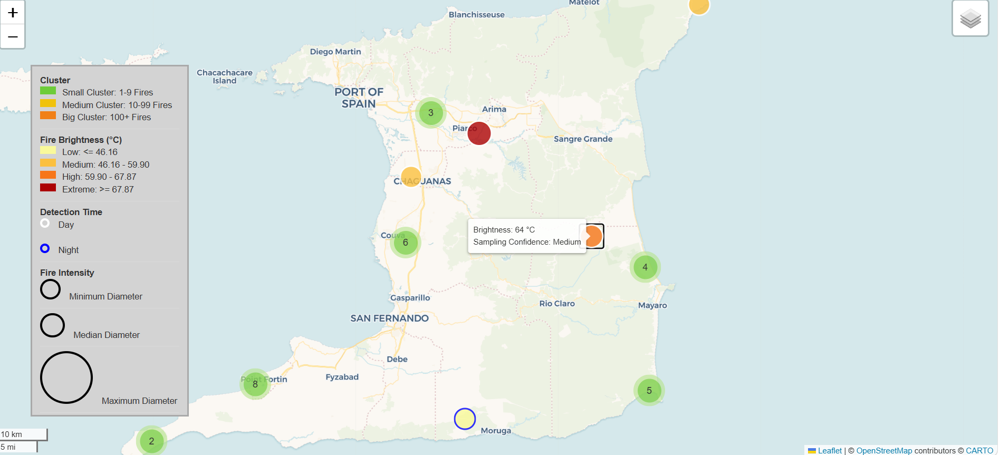

#### **Results**

4. Is there a relationship between fire brightness [°C] and fire radiative power (FRP)[W/m2] in Trinidad and Tobago?

Research question four can be answered, when looking at the thematic map showing fire brightness and intensity creat-ed for Trinidad and Tobago. Overall, 36 fires were detected in the past five days. Generally, the fires appear to be not as intense as most circles have a diameter close to the minimum or median. Even fires with an extreme temperature, so above 67.87 °C, do not display a bigger diameter. Indicative for this are the fire close to Piarco and the two fires in the eastern part of the island close to the Manzanilla Mayaro Road show. A broader study would be necessary to determine whether this is true for the entire continent of South America. 


#### **Improvements**
Here, the alignment of the diameter circles in the legend could be improved. However, as in the course we did not discuss how to write such a html-legend, it was decided not to use AI generated output but rather stick to the code, which is understood by the author. Additionally, the confidence could have been displayed using different transparancies of the colours. Generally, it would have been nice to combine all maps and then analyse the fires this way.
